# Check labels



In [1]:
import sys
import os

import numpy as np
import pandas as pd

import anndata as ad
import scanpy as sc
import squidpy as sq

import matplotlib.pyplot as plt
import seaborn as sns

import scvi

import joblib

import math

In [2]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, message=".*default value of 'ignore' for the `na_action` parameter.*")
warnings.filterwarnings("ignore", category=UserWarning, message=".*No data for colormapping provided via 'c'.*")
warnings.filterwarnings("ignore", category=UserWarning, message=".*ImplicitModificationWarning.*")
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning, module="scanpy")

In [3]:
import matplotlib as mpl
mpl.rcParams['axes.titlesize'] = 20  

## Local file info

In [4]:
out_dir = '/home/workspace/spatial_mouse_lung_outputs/cell_labeling/ouputs_mouselung_hurskainen_ref_consolidate_labels_xenseg_HDM'

if not os.path.exists (out_dir):
    os.makedirs(out_dir)

## Load adata

In [5]:
# Load xenium and reference adata objects
adata_filepath = os.path.join(out_dir, 'adata_concat_scanvi.h5ad')
adata_concat = sc.read_h5ad(adata_filepath)

# update obsm, obs
adata_concat.obsm['X_umap_scanvi_refalign'] = adata_concat.obsm['X_umap']
adata_concat.obs['label_scanvi'] = adata_concat.obs['C_scANVI']
adata_concat.obs['label_scanvi'] = adata_concat.obs['label_scanvi'].astype('category')

# take Xenium only (remove reference cells)
adata = adata_concat[adata_concat.obs['sample']!='hurskainen_ref', :]

## Visualize predicted labels

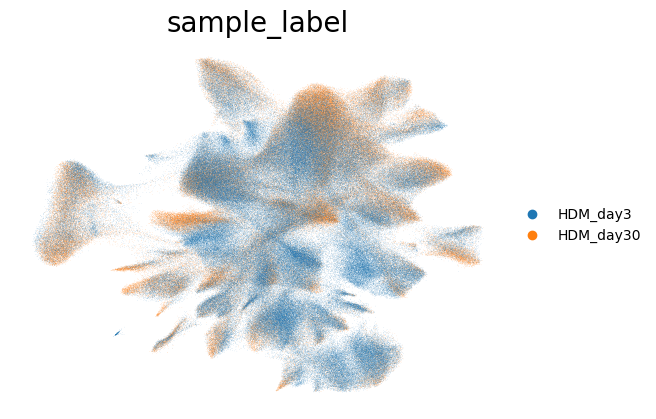

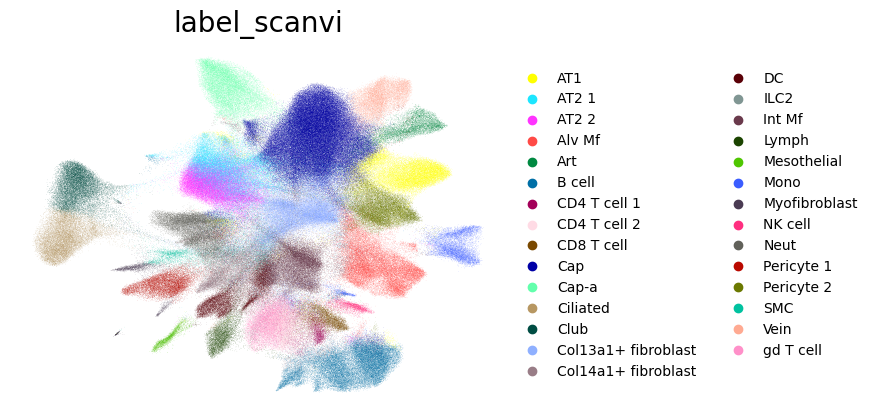

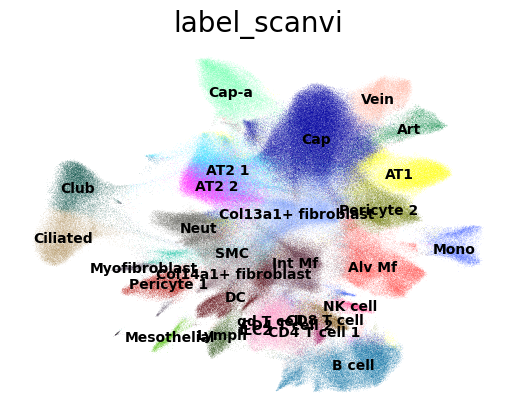

In [6]:
# scanvi dimensions
sc.pl.embedding(adata, basis='X_umap', color='sample_label', frameon=False)
sc.pl.embedding(adata, basis='X_umap', color='label_scanvi', frameon=False)
sc.pl.embedding(adata, basis='X_umap', color='label_scanvi', frameon=False, legend_loc='on data')

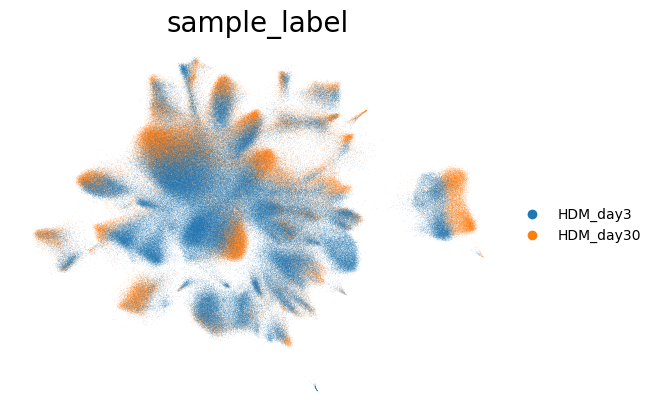

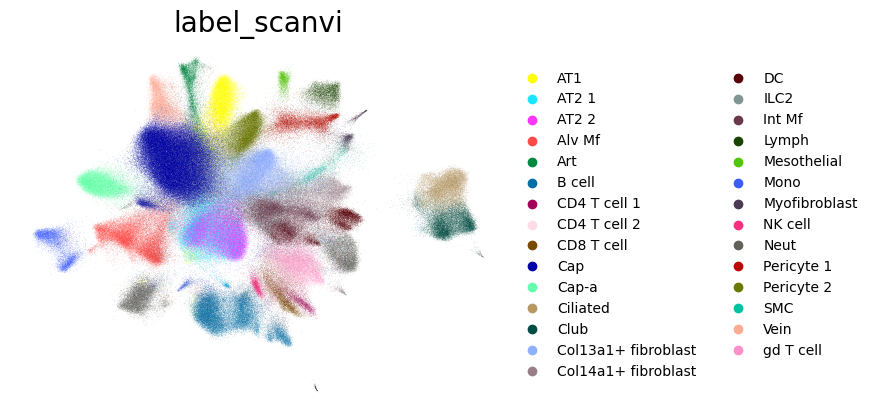

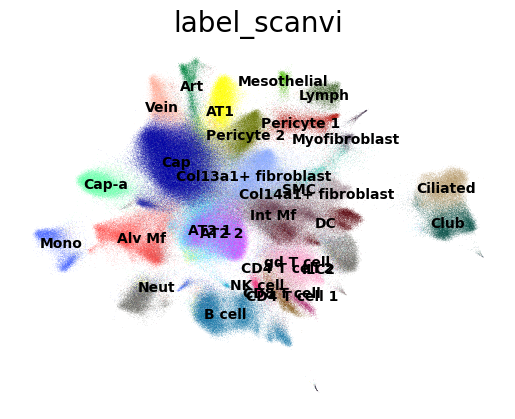

In [7]:
# scvi dimensions
sc.pl.embedding(adata, basis='X_umap_scvi_refalign', color='sample_label', frameon=False)
sc.pl.embedding(adata, basis='X_umap_scvi_refalign', color='label_scanvi', frameon=False)
sc.pl.embedding(adata, basis='X_umap_scvi_refalign', color='label_scanvi', frameon=False, legend_loc='on data')

## Update labels by subclustering and manually labeling

In [8]:
# major markers
major_markers_short = [  
    "Cd79a", # B cell
    "Cd3e", "Cd8a", "Cd4", # T cell
    "Cxcr5",
    "Foxp3",
    "Nkg7",
    "Apoe", #Mac
    "Cd34",  # BEC
    "Prox1", "Lyve1", # LEC
    "Epcam", # epithelial

]

tcell_markers = ['Cd79a', # b cell
                 'Nkg7', # NK
                 'Prdm1',
                 'Cd3e', 'Cd4', 'Cd8a', # t cell 
                 'Tcrg-C1', 'Tcrg-C2', 'Tcrg-C4', # gdTcell
                 'Rora', # ilc2
                 'Cd44', # activation
                'Foxp3', # Treg
                 'Gata3','Il1rl1', 'Il4', 'Il13', 'Il5', 'Ccr4',# Th2
                 'Tbx21', 'Ifng', 'Cxcr3',  # Th1
                 'Rorc','Il23a','Il17a','Ccr6',  # Th17
                 'Tcf7', # Tfh
                 'Cxcr6', 'Cxcr5','Cxcr4','Stat6',
                ]
tcell_markers_short = [
                       'Cd44', # activation
                       'Tcf7', 'Slamf6',
                       'Cxcr6',
                       'Gata3', 'Il1rl1',
                       'Foxp3', 'Rorc']
contaminating = ['Tcf21', 'Pdpn','Itgax', 'Slc34a2']
bcell_markers = ['Cd79a', 
                 'Prdm1' # plasmablasts
                ]
dc_markers = ['Xcr1', 'Cd8a','Clec9a', # cDC1
              'Clec1b', #cDC2
              'Ccr7', 'Irf4', 'Notch2','H2-Ab1','Ccr6','Ly6c2' # others to try
             #'Sirpa', 'CD11b' # cDC2
             ]


In [9]:
def subcluster_celltype(adata, label_col, labels, res=1, seed=1234):
    """
    Subcluster a specific cell type or set of labels in an AnnData object using a precomputed embedding (e.g., scVI).

    Parameters
    ----------
    adata : anndata.AnnData
        The full AnnData object containing expression data, metadata, and embeddings.

    label_col : 
        The name of the column in `adata.obs` that contains labels used for subsetting (e.g., "celltype", "cluster").

    labels : list
        A list of values to use for subsetting. These values will be matched against entries in `adata.obs[label_col]`.

    res : float, optional (default=1)
        Resolution parameter for Leiden clustering.

    seed : int, optional (default=1234)
        Random seed used for reproducibility.

    Returns
    -------
    adata_sub : anndata.AnnData
        The subset AnnData object containing only the specified labels, with new UMAP, Leiden clustering,
        and marker gene results stored.
    """
    np.random.seed(seed)
    
    # subcluster
    print(labels)
    print('res', res)
    adata_sub = adata[adata.obs[label_col].isin(labels), :]

    print('neighbors')
    sc.pp.neighbors(adata_sub, use_rep='X_scVI_refalign', key_added='neighbors_scvi_subset')
    print('leiden')
    sc.tl.leiden(adata_sub, neighbors_key='neighbors_scvi_subset', resolution=res, key_added='leiden_subset', n_iterations=2)
    print('umap')
    sc.tl.umap(adata_sub, neighbors_key='neighbors_scvi_subset')

    # identify markers of each subcluster 
    print('get cluster markers')
    sc.tl.rank_genes_groups(
        adata_sub,
        groupby='leiden_subset',  method='wilcoxon')
    
    # update the name of the subset umap dims
    adata_sub.obsm['X_umap_subset'] = adata_sub.obsm['X_umap']
    del adata_sub.obsm['X_umap']
    
    return adata_sub

In [10]:
# adata_CD4 = subcluster_celltype(adata, label_col= 'label_scanvi', labels = ['CD4 T cell 1', 'CD4 T cell 2'], res=1)
# adata_Bcell = subcluster_celltype(adata, label_col= 'label_scanvi', labels = ['B cell'], res=0.7)
# adata_DC = subcluster_celltype(adata, label_col= 'label_scanvi', labels = ['DC'], res=0.7)
# adata_CD8 = subcluster_celltype(adata, label_col= 'label_scanvi', labels = ['CD8 T cell'], res=0.7)

# adata_CD4.write_h5ad(os.path.join(out_dir, 'adata_CD4.h5ad'), compression='gzip')
# adata_Bcell.write_h5ad(os.path.join(out_dir, 'adata_Bcell.h5ad'), compression='gzip')
# adata_DC.write_h5ad(os.path.join(out_dir, 'adata_DC.h5ad'), compression='gzip')
# adata_CD8.write_h5ad(os.path.join(out_dir, 'adata_CD8.h5ad'), compression='gzip')

# adata_tcell_innate = subcluster_celltype(adata, label_col= 'label_scanvi', 
#                                          labels = ['CD4 T cell 1', 'CD4 T cell 2',
#                                                   'B cell','CD8 T cell','gd T cell', 'ILC2', 'NK cell'], 
#                                          res=1)
# adata_tcell_innate.write_h5ad(os.path.join(out_dir, 'adata_tcell_innate.h5ad'), compression='gzip')

### If subclustering already run and saved locally, load those adata objects

In [11]:
adata_tcell_innate = sc.read_h5ad(os.path.join(out_dir, 'adata_tcell_innate.h5ad'))

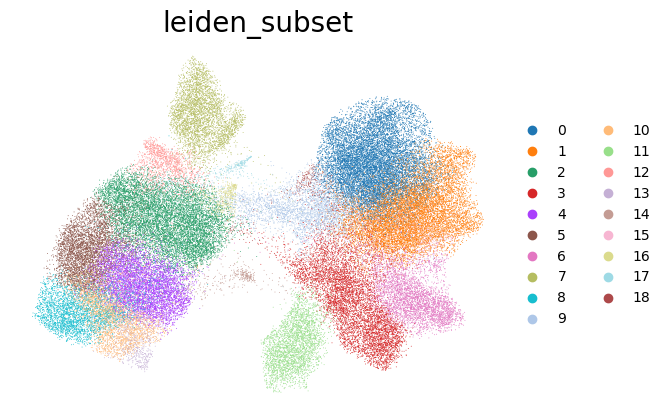

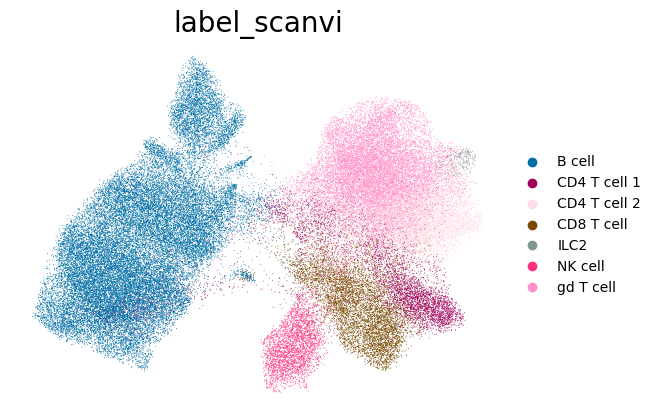

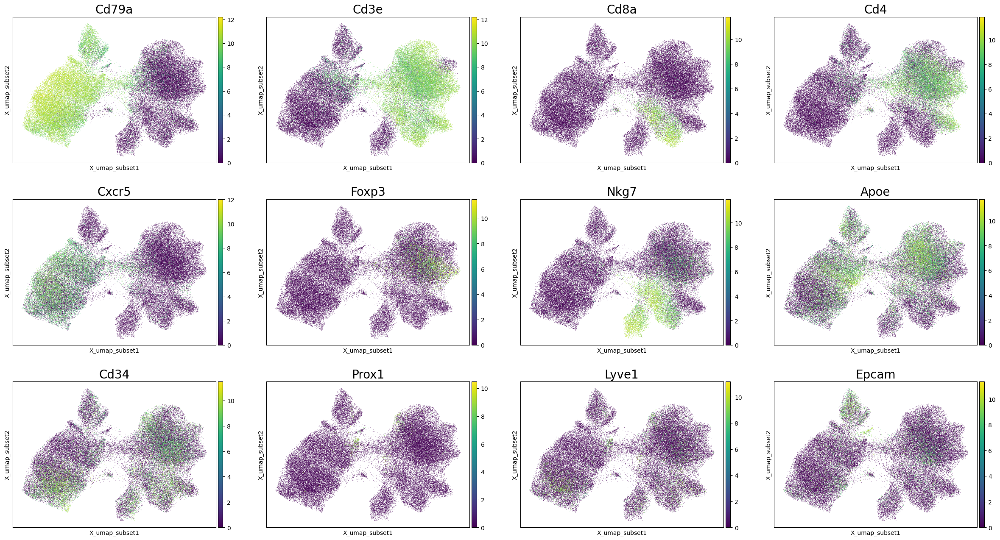

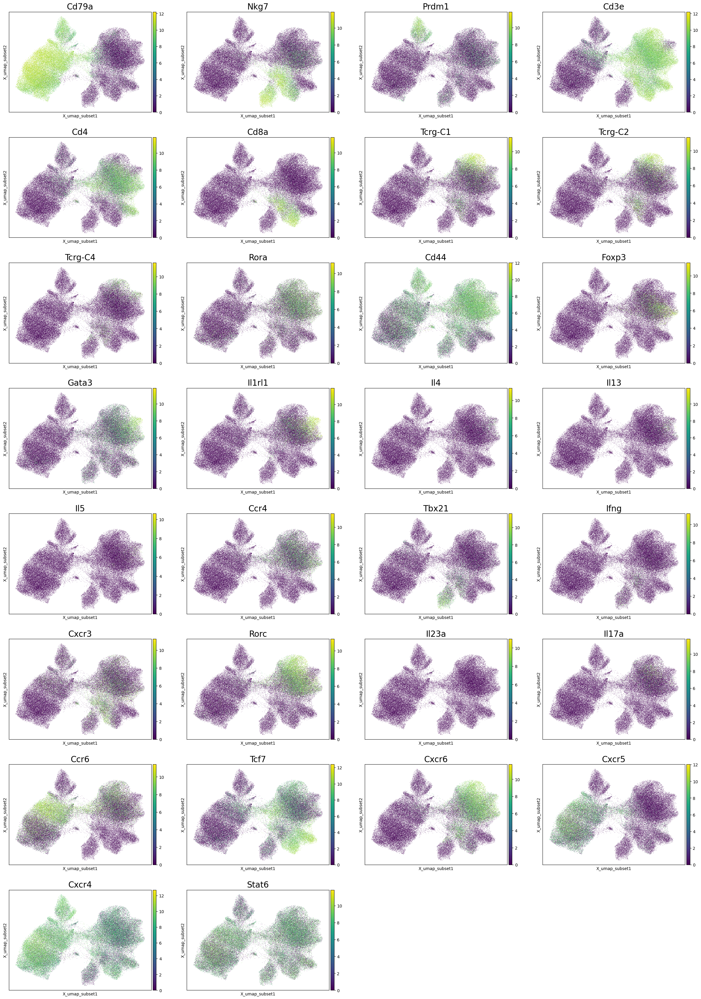

In [12]:
sc.pl.embedding(adata_tcell_innate, basis = 'X_umap_subset', color= ['leiden_subset'], frameon=False)
sc.pl.embedding(adata_tcell_innate, basis = 'X_umap_subset', color= ['label_scanvi'], frameon=False)
sc.pl.embedding(adata_tcell_innate, basis = 'X_umap_subset', color= major_markers_short)
sc.pl.embedding(adata_tcell_innate, basis = 'X_umap_subset', color= tcell_markers, ncols=4)

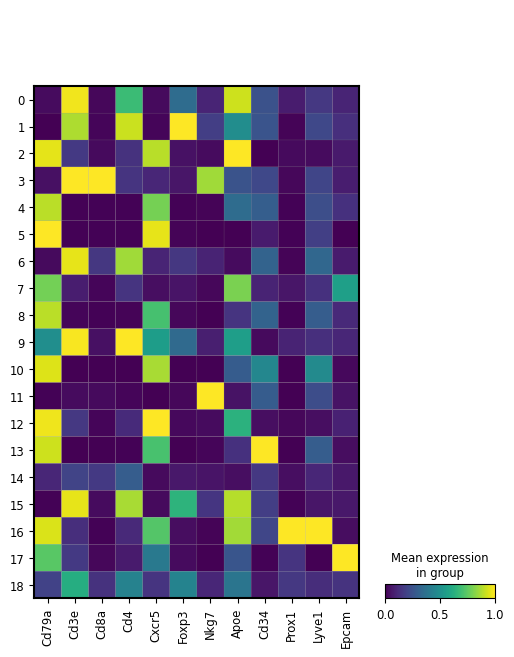

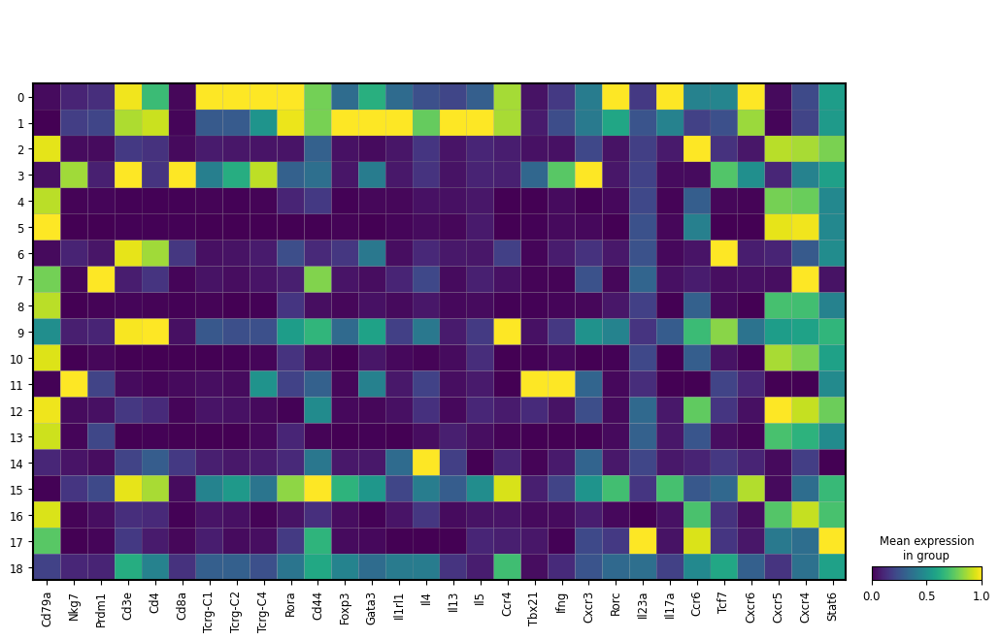

In [13]:
sc.pl.matrixplot(adata_tcell_innate, var_names=major_markers_short, groupby='leiden_subset', standard_scale='var')
sc.pl.matrixplot(adata_tcell_innate, var_names=tcell_markers, groupby='leiden_subset', standard_scale='var')